# COMPLETE ANALYSIS | 8th May 2024

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import triku as tk
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px



In [2]:
results_file = '/group/testa/Project/CBOProgPools/all_cells_complete_results.h5ad' 

In [3]:
adata = sc.read_h5ad('/group/testa/Project/CBOProgPools/cellsComplete.h5ad') 

In [4]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [5]:
adata

AnnData object with n_obs × n_vars = 353683 × 33694
    obs: 'phase', 'stage', 'celltype2', 'Dataset'

# PREPROCESSING

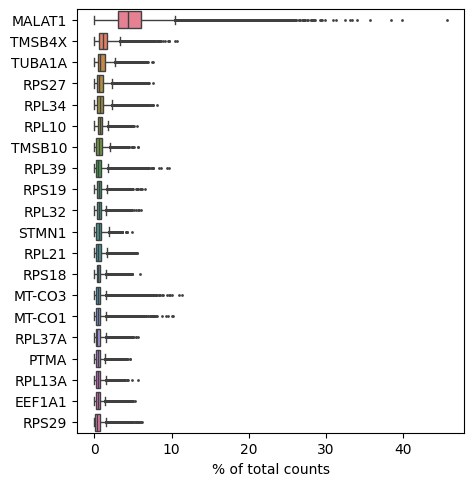

In [6]:
sc.pl.highest_expr_genes(adata, n_top=20, )


In [7]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=50)

In [8]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

adata.var['ribo'] = adata.var_names.str.startswith('RPL')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

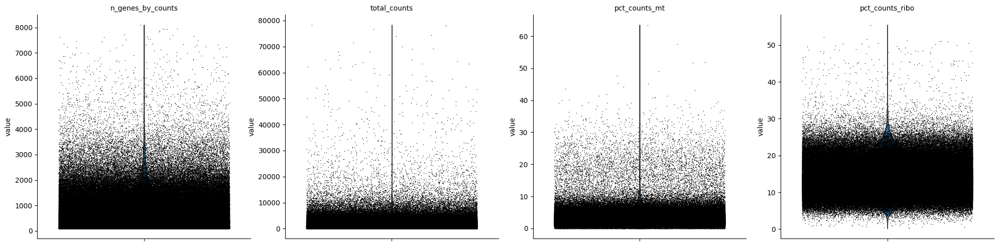

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

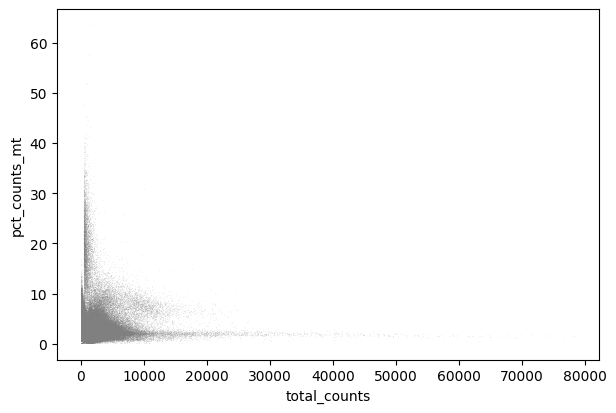

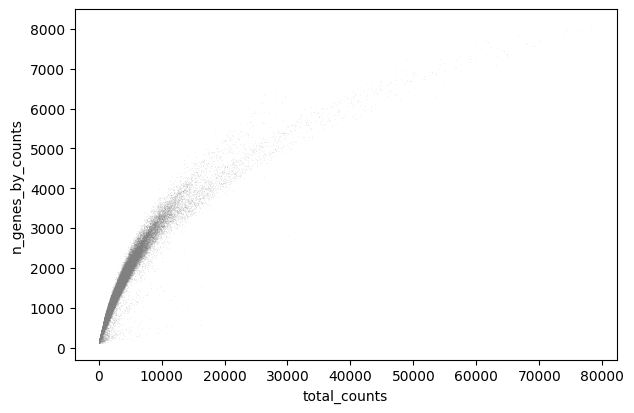

In [10]:
# Remove cells that have too many mitochondrial genes expressed or too many total counts:

sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
adata.raw = adata.copy()
adata.layers['Raw'] = adata.X.copy() 
sc.pp.normalize_total(adata, target_sum=3e4)
adata.layers['normalized'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['logNorm'] = adata.X.copy()
 
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=5, min_disp=0.5)
sc.pp.regress_out(adata, ['total_counts'], n_jobs = 4)
sc.pp.scale(adata, max_value=10)
 
## Dimensionality Reduction
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

In [12]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/pca_results.h5ad")

In [13]:
adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/pca_results.h5ad') 

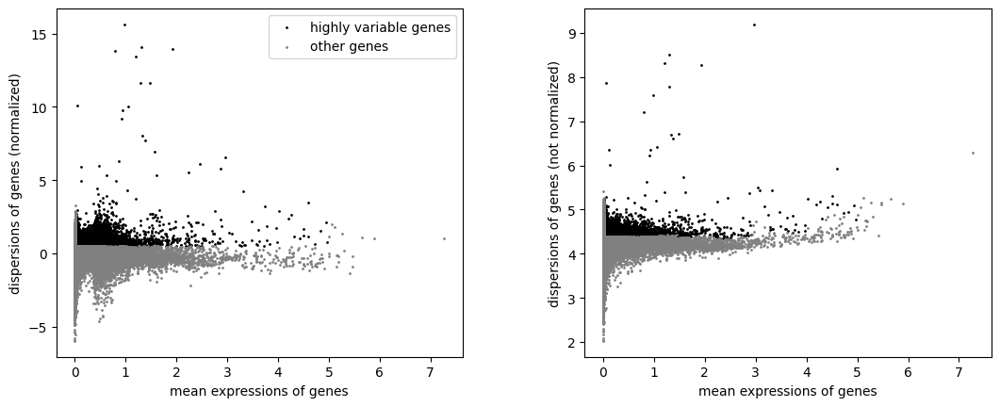

In [14]:
sc.pl.highly_variable_genes(adata)

In [15]:
#adata = adata[:, adata.var.highly_variable]

# PCA

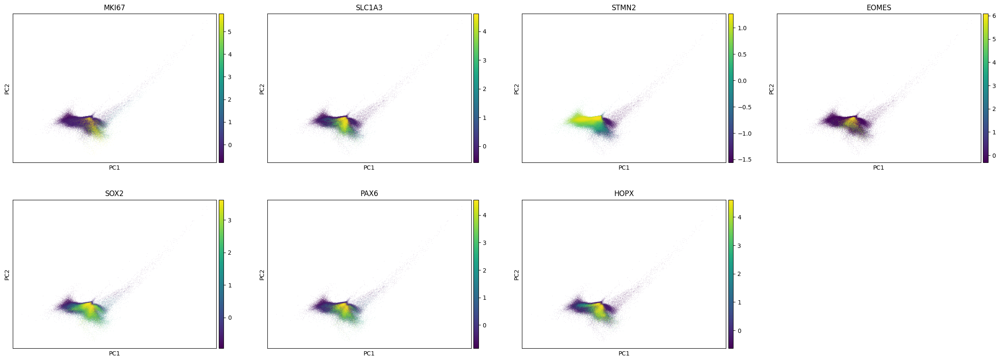

In [16]:
sc.pl.pca(adata, color=['MKI67','SLC1A3','STMN2', 'EOMES', 'SOX2', 'PAX6', 'HOPX'],use_raw=False,vmin="p1",vmax="p99") 

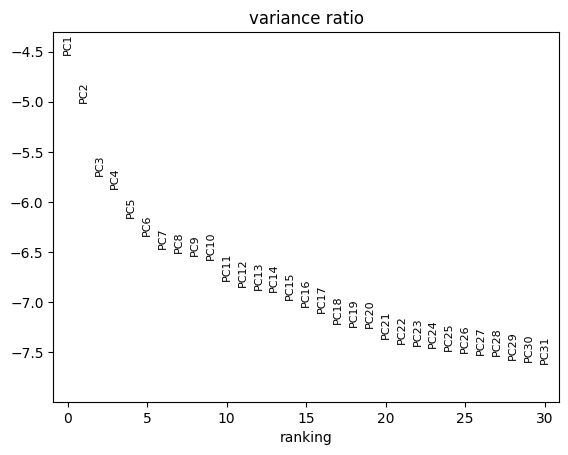

In [17]:
sc.pl.pca_variance_ratio(adata, log=True)


# Computing Neighborhood Graph

In [18]:
int(0.5 * len(adata) ** 0.5)

297

In [19]:
sc.pp.neighbors(adata, n_neighbors=100, n_pcs=15)

In [20]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/neighbours_results.h5ad")

# Embedding Neighborhood Graph

In [21]:
sc.tl.leiden(adata,resolution=0.5,key_added="leiden")

In [22]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/leiden_results.h5ad")

In [23]:
adata.obs.leiden.value_counts()

leiden
0     63773
1     58428
2     51078
3     29708
4     22634
5     20120
6     19765
7     13774
8     11465
9     11423
10    10076
11    10030
12     9740
13     7567
14     6274
15     3667
16     2707
17     1454
Name: count, dtype: int64

In [24]:
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

In [25]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/umap_results.h5ad")

In [26]:
sc.tl.umap(adata)

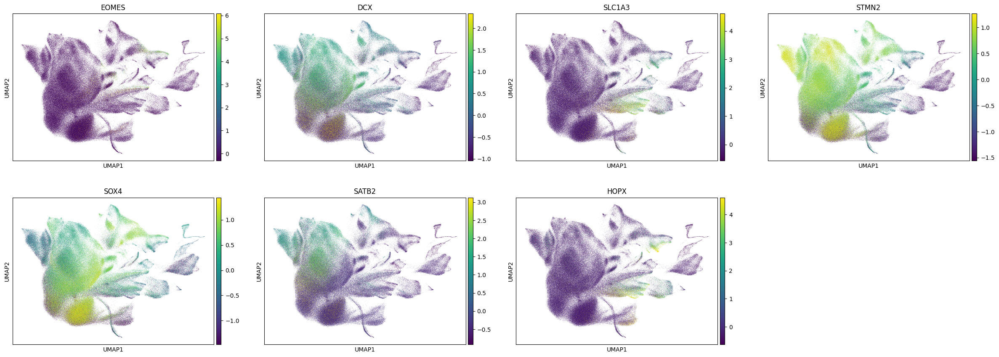

In [27]:
sc.pl.umap(adata, color=['EOMES','DCX','SLC1A3','STMN2','SOX4','SATB2','HOPX'], use_raw=False,vmin="p1",vmax="p99")

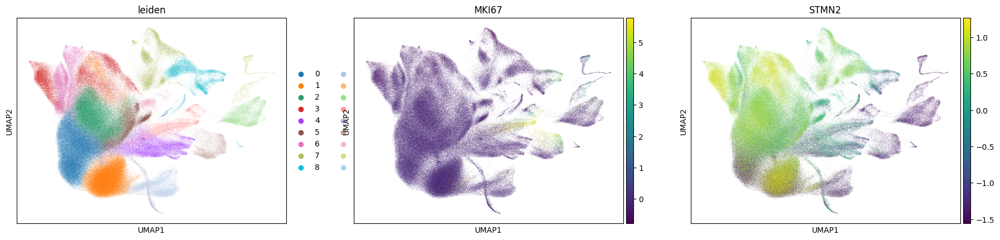

In [ ]:
sc.pl.umap(adata, color=['leiden', 'MKI67','STMN2'], use_raw=False,vmin="p1",vmax="p99")

In [ ]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/clust_neighbours_results.h5ad")

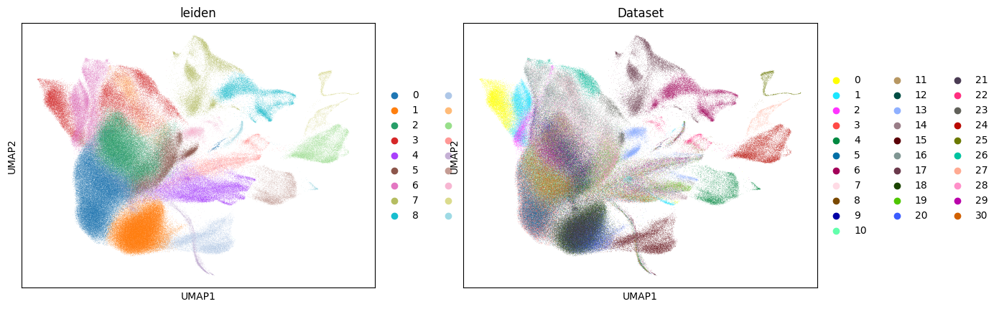

In [ ]:
sc.pl.umap(adata, color=['leiden','Dataset', 'stage'], use_raw=False,vmin="p1",vmax="p99")

# Integration 

In [ ]:
sc.pp.harmony_integrate(adata, 'Dataset',adjusted_basis = "X_pca", max_iter_harmony = 20)

In [ ]:
sc.pl.pca_variance(adata,log=True)

In [ ]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/harmony_results.h5ad")

# Recalculate the nighbors leiden and umap after harmonize integration

In [ ]:
sc.pp.neighbors(adata, n_neighbors=100, n_pcs=10)
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/neighbours_harmonize_results.h5ad")

In [ ]:
sc.tl.leiden(adata, resolution=0.5, key_added ="leiden_harmony") 
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/leiden_harmonize_results.h5ad")

In [ ]:
sc.tl.umap(adata)
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/umap_harmonize_results.h5ad")

# Visualization of the data after integration

In [29]:
adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/umap_harmonize_results.h5ad') 

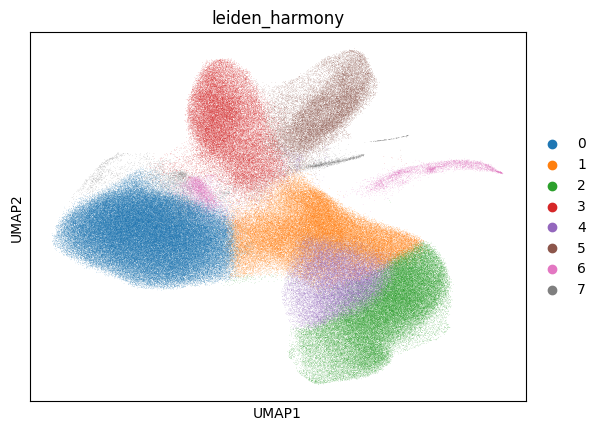

In [30]:
sc.pl.umap(adata, color=['leiden_harmony'], use_raw=False,vmin="p1",vmax="p99")

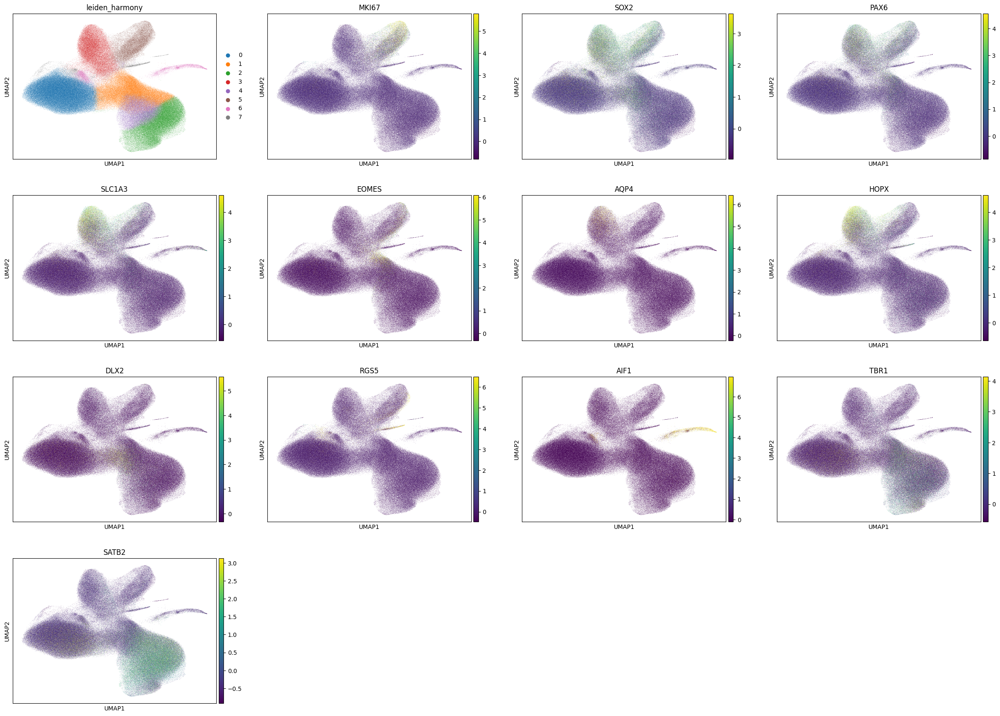

In [ ]:
sc.pl.umap(adata, color=['leiden_harmony', 'MKI67', 'SOX2', 'PAX6', 'SLC1A3', 'EOMES', 'AQP4', 'HOPX', 'DLX2', 'RGS5', 'AIF1', 'TBR1', 'SATB2'], use_raw=False,vmin="p1",vmax="p99")

In [31]:
# HARMONIZE CELLTYPE NAMES
tmp = adata.obs.copy()
tmp['celltype'] = tmp['celltype2'].copy()
tmp.celltype2.replace({"Mat":"MatExc",
                       "Mig/Mat":"MigExc/MatExc",
                       "Interneuron":"Inter",
                       "Mig/MatExc":"MigExc/MatExc",
                       "-":"UNK",
                       "oRG/Astro":"oRG/astro",
                       "ExcMat/Upp":"MatExc/MatUpp",
                       "DeepLayer/IP":"IP/DeepLayer",
                       "astrocyte":"astrocytes",
                       "endo":"endothelial"},
                       inplace=True)
adata.obs = tmp

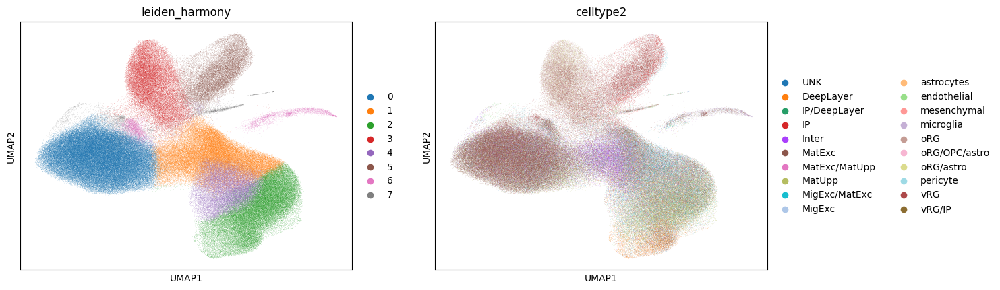

In [ ]:
sc.pl.umap(adata, color=['leiden_harmony', 'celltype2'], use_raw=False,vmin="p1",vmax="p99")

# PLOTING EACH CELLTYPE INDIVIDUALLY

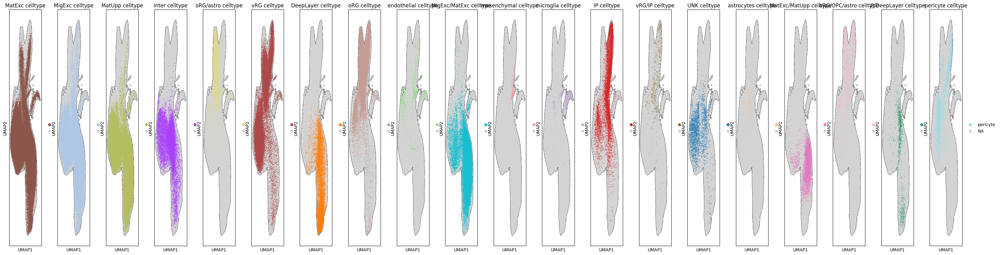

In [ ]:
fig, axes = plt.subplots(1,len(adata.obs.celltype2.unique()), figsize=(40, 10))
for line in enumerate(adata.obs.celltype2.unique()):
    celltypes = adata.obs.loc[adata.obs.celltype2 == line[1],"celltype2"].unique().tolist()
    axes[line[0]] = sc.pl.umap(adata, size = 10, add_outline=True,ncols=2, color=["celltype2"],title="{} celltype".format(line[1]),
                     groups=celltypes, vmin='p1', vmax='p99', show=False, ax=axes[line[0]])
plt.subplots_adjust(wspace=.5)
fig.show()


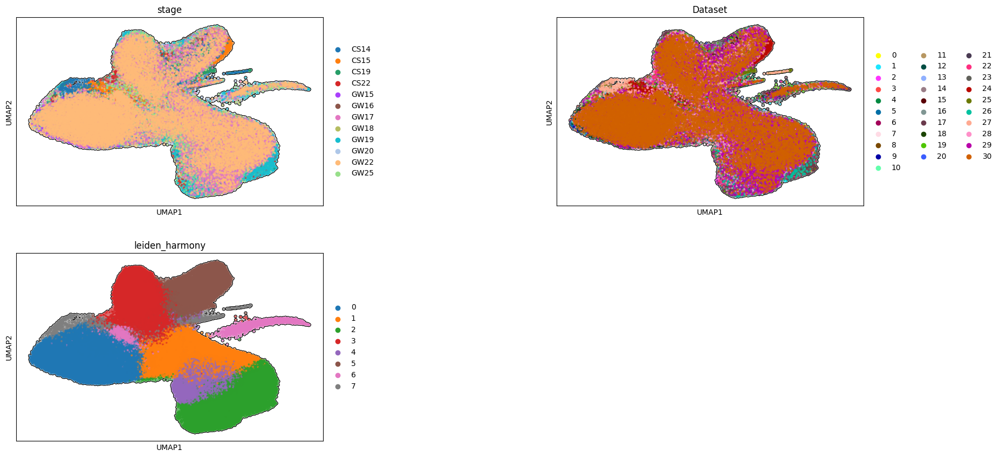

In [ ]:
sc.pl.umap(adata, size = 30, add_outline=True,ncols=2, color=["stage","Dataset","leiden_harmony"], vmin='p1', vmax='p99', wspace=.6)

In [ ]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/celltypes_harmonize_results.h5ad")

# Diffmaps

In [ ]:
sc.tl.diffmap(adata)

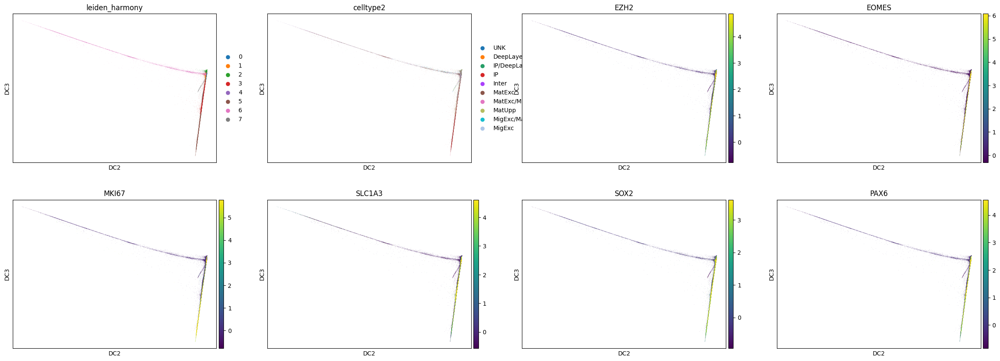

In [ ]:
sc.pl.diffmap(adata,color=["leiden_harmony", 'celltype2','EZH2', 'EOMES','MKI67','SLC1A3','SOX2','PAX6'],dimensions=(1,2),vmin='p1',vmax='p99',use_raw=False)

In [ ]:
# REMOVE CLUSTER 6 and 7 ==> markers:  'RGS5', 'AIF1'
adata_check = adata[~adata.obs.leiden_harmony.isin(['6', '7'])].copy()

In [ ]:
sc.tl.diffmap(adata_check)

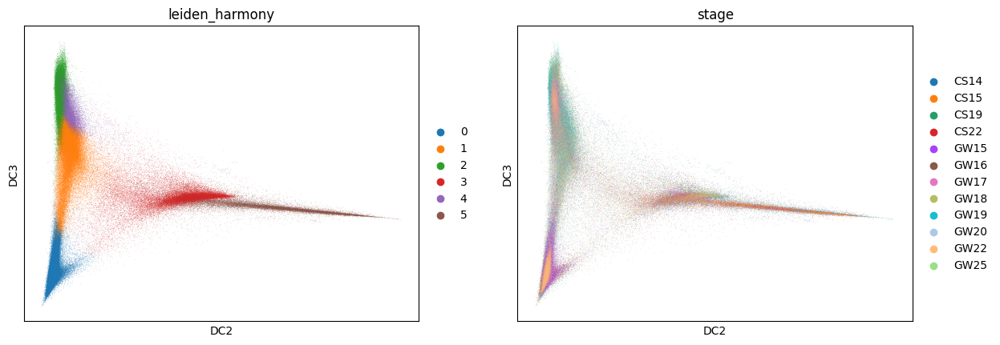

In [ ]:
sc.pl.diffmap(adata_check,color=["leiden_harmony", 'stage'],dimensions=(1,2),vmin='p1',vmax='p99',use_raw=False)

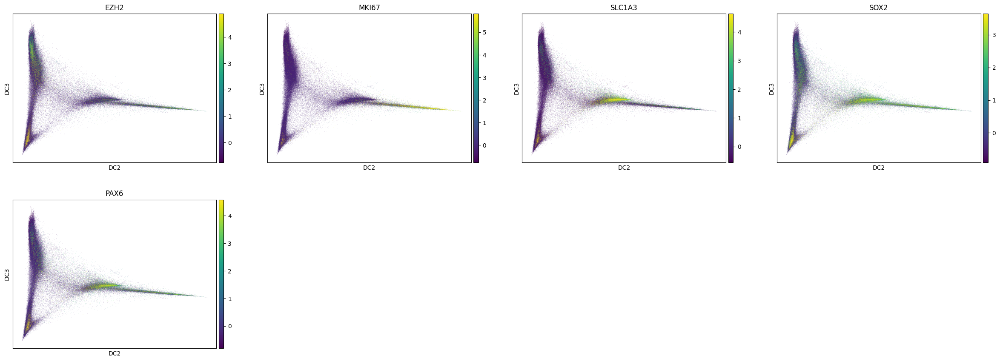

In [ ]:
sc.pl.diffmap(adata_check,color=['EZH2','MKI67','SLC1A3','SOX2','PAX6'],dimensions=(1,2),vmin='p1',vmax='p99',use_raw=False)

In [ ]:
adata_check.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/diffmap_harmonize_results.h5ad")

# Finding gene markers

In [ ]:
#adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/celltypes_harmonize_results.h5ad') 

categories: 0, 1, 2, etc.
var_group_labels: astrocytes, pericyte, microglia, etc.


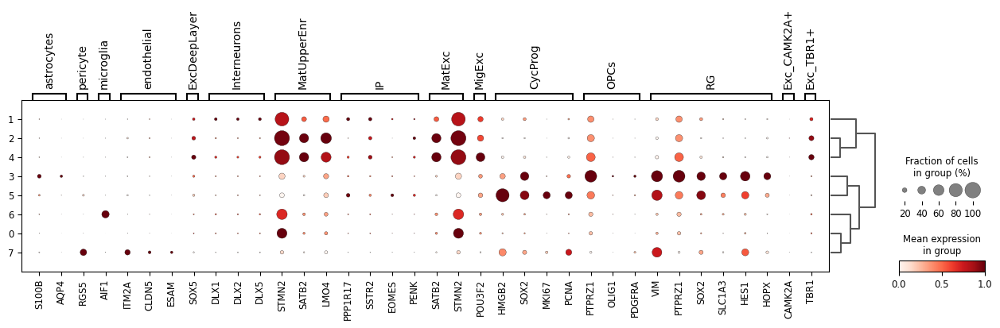

In [ ]:
geschwind_ext = {
  'astrocytes' : ['S100B','AQP4'],
  'pericyte' : ['RGS5'],
  'microglia' : ['AIF1'],
  'endothelial' : ['ITM2A','CLDN5','ESAM'],
  'ExcDeepLayer' : ['SOX5'],
  'Interneurons' : ['DLX1','DLX2','DLX5'],
  'MatUpperEnr' : ['STMN2','SATB2','LMO4'],
  'IP' : ['PPP1R17','SSTR2','EOMES','PENK'],
  'MatExc' : ['SATB2','STMN2'],
  'MigExc' : ['POU3F2'],
  'CycProg' : ['HMGB2','SOX2','MKI67','PCNA'],
  'OPCs' : ['PTPRZ1','OLIG1','PDGFRA'],
  'RG' : ['VIM','PTPRZ1','SOX2','SLC1A3','HES1','HOPX'],
  'Exc_CAMK2A+' : ['CAMK2A'],
  'Exc_TBR1+' : ['TBR1']
}

sc.pl.dotplot(adata, geschwind_ext , 'leiden_harmony', dendrogram=True,use_raw=False,log=True,standard_scale='var')

In [ ]:
cluster2annotation = {
    "0": "ExcMat0", "1": "Mixed","2":"MatUpp", "3": "oRG",
    "4": "MatUpp", "5" : "vRG", "6":"microglia","7":"pericytes"    
}
 
adata.obs['celltype'] = adata.obs['leiden_harmony'].map(cluster2annotation).astype('category')

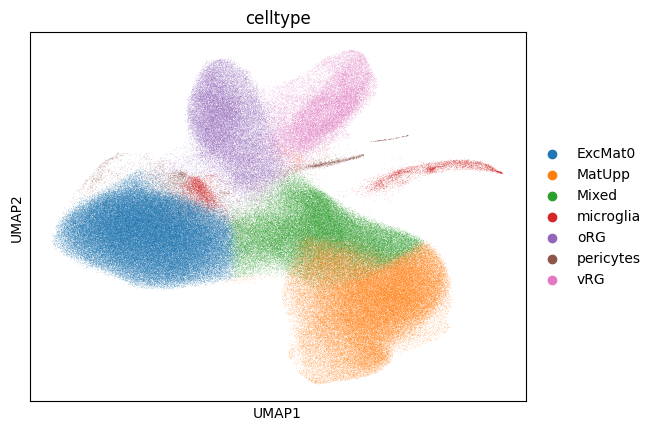

In [ ]:
sc.pl.umap(adata,color="celltype")

**IP markers**

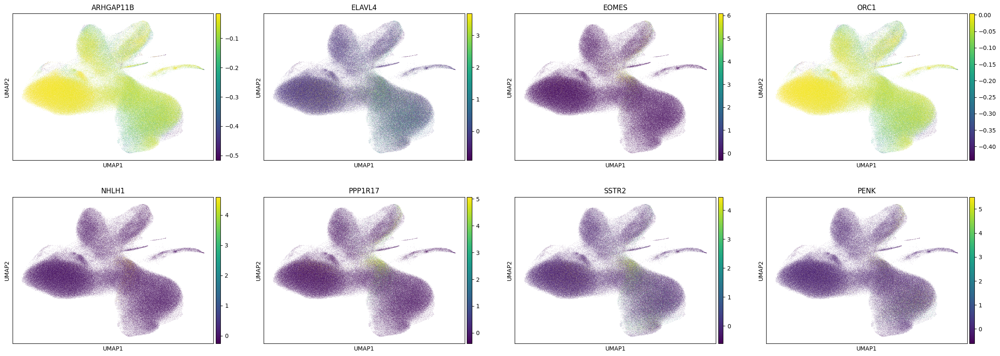

In [ ]:

sc.pl.umap(adata,color=["ARHGAP11B","ELAVL4","EOMES","ORC1","NHLH1",'PPP1R17','SSTR2','PENK'],vmin="p1",vmax="p99",use_raw=False)

**GABA markers**

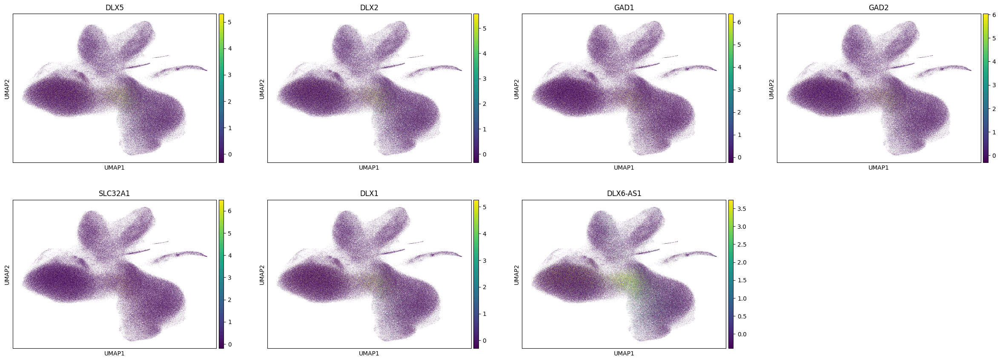

In [ ]:
sc.pl.umap(adata,color=["DLX5","DLX2","GAD1","GAD2","SLC32A1",'DLX1','DLX6-AS1'],vmin="p1",vmax="p99",use_raw=False)

**ASTROCYTE markers**

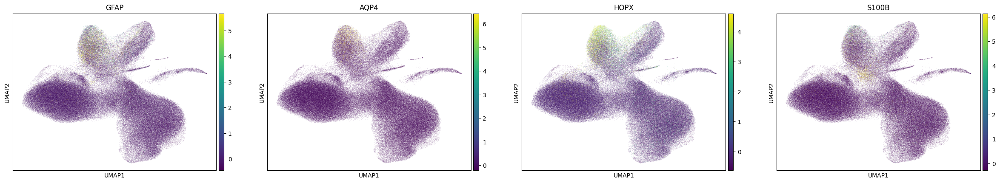

In [ ]:
sc.pl.umap(adata,color=['GFAP','AQP4','HOPX','S100B'],vmin="p1",vmax="p99",use_raw=False)

In [ ]:
IPgenes = ["EOMES","NHLH1",'PENK','SSTR2','PPP1R17']
GABAgenes = ["DLX5","DLX2","GAD2",'DLX1','DLX6-AS1']
astro_genes = ['GFAP','AQP4','HOPX','S100B']


sc.tl.score_genes(adata, IPgenes, ctrl_size=50, gene_pool=None, n_bins=25, score_name='IP_score', random_state=0, copy=False, use_raw=False)
sc.tl.score_genes(adata, GABAgenes, ctrl_size=50, gene_pool=None, n_bins=25, score_name='GABA_score', random_state=0, copy=False, use_raw=False)
sc.tl.score_genes(adata, astro_genes, ctrl_size=50, gene_pool=None, n_bins=25, score_name='astro_score', random_state=0, copy=False, use_raw=False)

In [ ]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/score_genes_results.h5ad")

In [52]:
tmp = adata.obs.copy()
tmp.celltype = pd.Categorical(tmp.celltype, categories=['ExcMat0','Mixed','MatUpp','oRG',"vRG",'GABA','IP','microglia','pericytes','astro'])

# SCORING CELLS

In [53]:
# Scoring cells based on gene expression is a method used to quantify how closely individual cells match 
# specific gene expression profiles associated with particular cell types. 

# by scoring cells based on these gene sets we can identify cells that strongly express the genes characteristic of these 
# ( atsro, IP and GABA ) cell types, even if their initial cluster-based annotation might not be very specific.


# Scores > 1: If a cell has a score greater than 1 for a particular gene set (e.g., GABA score, IP score, astro score), 
# it means that the cell expresses those genes at levels significantly higher than the average, indicating a strong 
# match to that cell type's profile.

# Scores ≤ 1: If a cell has a score of 1 or lower, it means that the cell does not strongly express the genes 
# characteristic of that cell type, indicating a weaker match to that profile.

In [54]:
GABA_cells = list(adata[(adata.obs.GABA_score > 1)& (adata.obs.celltype == "Mixed")].obs.index)
IP_cells = list(adata[(adata.obs.IP_score > 1) & (adata.obs.celltype.isin(["Mixed"]))].obs.index)
astro_cells = list(adata[(adata.obs.astro_score > 1) & (adata.obs.celltype.isin(["oRG"]))].obs.index)

In [55]:
tmp.loc[tmp.index.isin(GABA_cells),'celltype'] = 'GABA'
tmp.loc[tmp.index.isin(IP_cells),'celltype'] = 'IP'
tmp.loc[tmp.index.isin(astro_cells),'celltype'] = 'astro'
adata.obs = tmp.copy()

In [56]:
print(adata.obs[['IP_score', 'GABA_score', 'astro_score']])


                    IP_score  GABA_score  astro_score
AAACCTGAGACTAGAT-1 -0.396409   -0.594960    -0.441628
AAACCTGAGCTAAGAT-1 -0.335715   -0.481703    -0.555402
AAACCTGAGGACGAAA-1 -0.304543   -0.719876    -0.390359
AAACCTGAGTCAATAG-1 -0.514791   -0.391230    -0.500407
AAACCTGAGTCATCCA-1 -0.354111   -0.272154    -0.236852
...                      ...         ...          ...
TTTGTCATCATAGCAC-1 -0.107302   -0.073635    -0.014854
TTTGTCATCCGTAGGC-1 -0.057910   -0.133938    -0.095663
TTTGTCATCGGCGGTT-1 -0.067632   -0.099173     0.988714
TTTGTCATCTACCAGA-1 -0.181403   -0.446075     2.289936
TTTGTCATCTGGCGTG-1 -0.089074   -0.112725    -0.053285

[353683 rows x 3 columns]


In [57]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/new_cell_names.h5ad")

In [58]:
adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/new_cell_names.h5ad') 

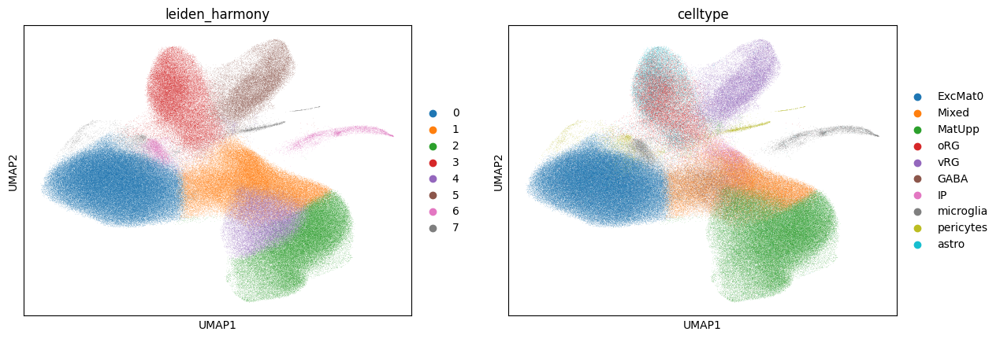

In [59]:
sc.pl.umap(adata,color=['leiden_harmony','celltype'],vmin="p1",vmax="p99",use_raw=False)

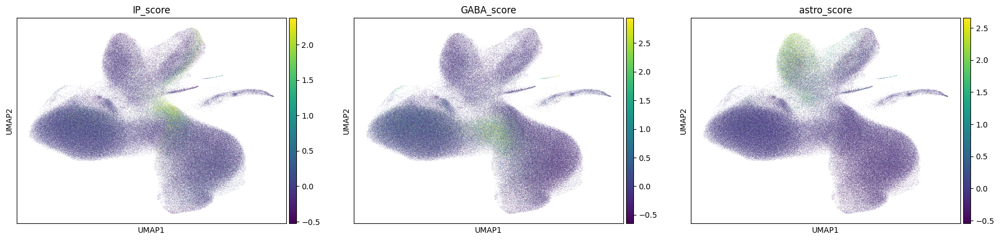

In [60]:
sc.pl.umap(adata,color=['IP_score','GABA_score','astro_score'],vmin="p1",vmax="p99",use_raw=False)

In [61]:
adata.obs.celltype.value_counts()

celltype
ExcMat0      119308
MatUpp        87834
Mixed         44340
vRG           23927
oRG           23104
astro         19366
GABA          13114
IP             9275
microglia      8159
pericytes      5256
Name: count, dtype: int64

In [62]:
adata[adata.obs.celltype == "Mixed"].obs.celltype2.value_counts()

celltype2
MatExc           14570
MigExc           12170
MatUpp            6634
MigExc/MatExc     4471
Inter             1927
DeepLayer         1461
vRG                764
MatExc/MatUpp      740
IP                 479
UNK                347
oRG                319
IP/DeepLayer       163
pericyte           100
endothelial         66
oRG/astro           44
oRG/OPC/astro       31
vRG/IP              27
astrocytes          14
microglia           11
mesenchymal          2
Name: count, dtype: int64

In [2]:
adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/new_cell_names.h5ad') 

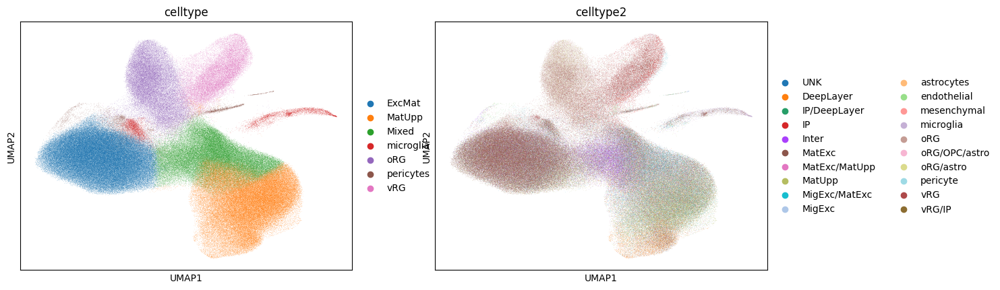

In [10]:
sc.pl.umap(adata,color=['celltype','celltype2'],vmin="p1",vmax="p99",use_raw=False)

In [7]:
cluster2annotation = {
    "0": "ExcMat", "1": "Mixed","2":"MatUpp", "3": "oRG",
    "4": "MatUpp", "5" : "vRG", "6":"microglia","7":"pericytes"    
}
 
adata.obs['celltype'] = adata.obs['leiden_harmony'].map(cluster2annotation).astype('category')

In [37]:
# Filter the cells based on the conditions and get the index MATEXC
MatExc_Mixed = adata.obs[(adata.obs['celltype2'] == "MatExc") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index INTERNEURONS
Inter_Mixed = adata.obs[(adata.obs['celltype2'] == "Inter") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index IP
IP_Mixed = adata.obs[(adata.obs['celltype2'] == "IP") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index MATUPP
MatUpp_Mixed = adata.obs[(adata.obs['celltype2'] == "MatUpp") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index DEEPLAYER
DeepLayer_Mixed = adata.obs[(adata.obs['celltype2'] == "DeepLayer") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index MIG/MatExc
MigMat_Mixed = adata.obs[(adata.obs['celltype2'] == "MigExc/MatExc") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index IP/DeepLayer
IPDeepLayer_Mixed = adata.obs[(adata.obs['celltype2'] == "IP/DeepLayer") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index Exc/Upp
ExcUpp_Mixed = adata.obs[(adata.obs['celltype2'] == "MatExc/MatUpp") & (adata.obs['celltype'] == "Mixed")].index

# Filter the cells based on the conditions and get the index Exc/Upp
MigExc_Mixed = adata.obs[(adata.obs['celltype2'] == "MigExc") & (adata.obs['celltype'] == "Mixed")].index




In [38]:
# Ensure new categories are included in the 'celltype' categories
new_categories = ["MigExc", "IP", "MatUpp", "MatExc", "Inter", "DeepLayer" ]
for category in new_categories:
    if category not in adata.obs['celltype'].cat.categories:
        adata.obs['celltype'] = adata.obs['celltype'].cat.add_categories(category)



In [39]:
# Update the celltype for the filtered cells
adata.obs.loc[adata.obs.index.isin(MatExc_Mixed), "celltype"] = "MatExc"
adata.obs.loc[adata.obs.index.isin(Inter_Mixed), "celltype"] = "Inter"
adata.obs.loc[adata.obs.index.isin(IP_Mixed), "celltype"] = "IP"
adata.obs.loc[adata.obs.index.isin(MatUpp_Mixed), "celltype"] = "MatUpp"
adata.obs.loc[adata.obs.index.isin(DeepLayer_Mixed), "celltype"] = "DeepLayer"
adata.obs.loc[adata.obs.index.isin(MigMat_Mixed), "celltype"] = "MigExc"
adata.obs.loc[adata.obs.index.isin(IPDeepLayer_Mixed), "celltype"] = "IP"
adata.obs.loc[adata.obs.index.isin(ExcUpp_Mixed), "celltype"] = "MatUpp"
adata.obs.loc[adata.obs.index.isin(ExcUpp_Mixed), "celltype"] = "MatUpp"
adata.obs.loc[adata.obs.index.isin(MigExc_Mixed), "celltype"] = "MigExc"



In [40]:
print(adata.obs['celltype'].value_counts())


celltype
ExcMat       114389
MatUpp        95449
oRG           36648
MatExc        28331
MigExc        23882
vRG           23292
Inter         11302
microglia      7827
pericytes      5079
IP             2833
DeepLayer      2556
Mixed          2095
Name: count, dtype: int64


In [34]:
adata = sc.read_h5ad('/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/renamed_mixed_cells_results.h5ad') 

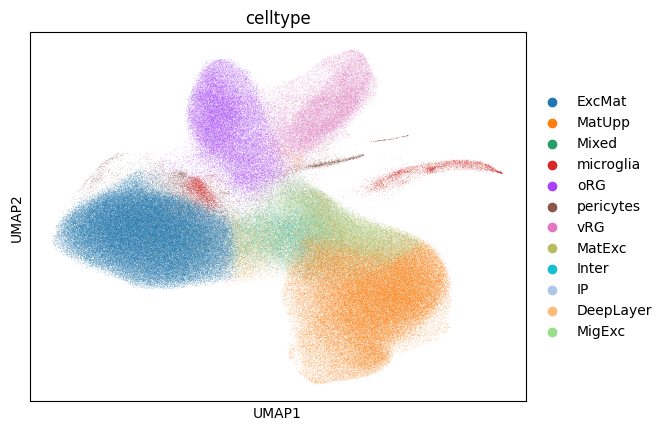

In [35]:
sc.pl.umap(adata,color=['celltype'],vmin="p1",vmax="p99",use_raw=False)

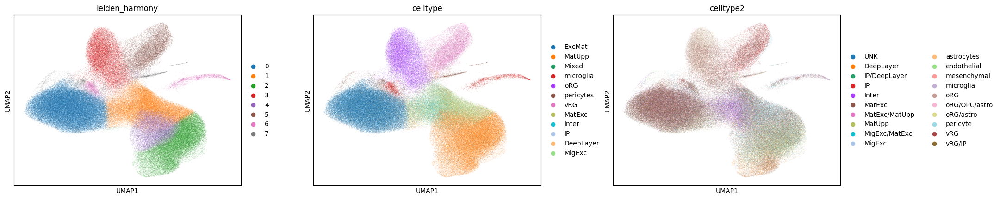

In [42]:
# Generate the UMAP plots
sc.pl.umap(adata, color=['leiden_harmony', 'celltype', 'celltype2'], vmin="p1", vmax="p99", use_raw=False, wspace=0.2)



In [42]:
adata.write_h5ad("/group/testa/Users/marina.fuster/dockerbase/ResultsAllCells/renamed_mixed_cells_results.h5ad")

# River Plot

**LEIDEN CLUSTERS TO CELLTYPES**

In [100]:
# Creating the contingency table for the Sankey diagram
transition_counts = pd.crosstab(adata.obs['leiden_harmony'], adata.obs['celltype']).stack().reset_index()
transition_counts.columns = ['source', 'target', 'value']

In [101]:
# Map each unique label in 'source' and 'target' to a unique integer for plotting
labels = pd.concat([transition_counts['source'].astype(str), transition_counts['target']]).unique()
label_indices = {label: idx for idx, label in enumerate(labels)}

# Apply the mapping to your data
transition_counts['source'] = transition_counts['source'].astype(str).map(label_indices)
transition_counts['target'] = transition_counts['target'].map(label_indices)

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,  # Padding between nodes
        thickness=20,  # Node thickness
        line=dict(color="black", width=0.5),
        label=labels  # Labels for nodes
    ),
    link=dict(
        source=transition_counts['source'],  # Indices of source nodes
        target=transition_counts['target'],  # Indices of target nodes
        value=transition_counts['value']  # Values for each flow
    ))])

fig.update_layout(title_text="Sankey Diagram: Leiden Clusters to Cell Types", font_size=10)
fig.show()


**STAGES TO CELLTYPES**

In [110]:
# Creating the contingency table for the Sankey diagram
transition_counts = pd.crosstab(adata.obs['stage'], adata.obs['celltype']).stack().reset_index()
transition_counts.columns = ['source', 'target', 'value']

In [112]:
# Map each unique label in 'source' and 'target' to a unique integer for plotting
labels = pd.concat([transition_counts['source'].astype(str), transition_counts['target']]).unique()
label_indices = {label: idx for idx, label in enumerate(labels)}

# Apply the mapping to your data
transition_counts['source'] = transition_counts['source'].astype(str).map(label_indices)
transition_counts['target'] = transition_counts['target'].map(label_indices)

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,  # Padding between nodes
        thickness=20,  # Node thickness
        line=dict(color="black", width=0.5),
        label=labels  # Labels for nodes
    ),
    link=dict(
        source=transition_counts['source'],  # Indices of source nodes
        target=transition_counts['target'],  # Indices of target nodes
        value=transition_counts['value']  # Values for each flow
    ))])

fig.update_layout(title_text="Sankey Diagram: Stages to Cell Types", font_size=10)
fig.show()


**TRYING TO COLOR THE LINES**

In [117]:
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px

# Assuming 'adata' is your AnnData object containing the observations
# Creating the contingency table for the Sankey diagram
transition_counts = pd.crosstab(adata.obs['leiden_harmony'], adata.obs['celltype']).stack().reset_index()
transition_counts.columns = ['source', 'target', 'value']

# Map each unique label in 'source' and 'target' to a unique integer for plotting
labels = pd.concat([transition_counts['source'].astype(str), transition_counts['target'].astype(str)]).unique()
label_indices = {label: idx for idx, label in enumerate(labels)}

# Apply the mapping to your data
transition_counts['source'] = transition_counts['source'].astype(str).map(label_indices)
transition_counts['target'] = transition_counts['target'].map(label_indices)

# Create a color map for each unique source
unique_sources = transition_counts['source'].unique()
colors = px.colors.qualitative.Plotly  # Using Plotly's qualitative color palette
color_map = {source: colors[i % len(colors)] for i, source in enumerate(unique_sources)}

# Map the colors to the links
link_colors = transition_counts['source'].map(color_map)

# Create the Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,  # Padding between nodes
        thickness=20,  # Node thickness
        line=dict(color="black", width=0.5),
        label=labels  # Labels for nodes
    ),
    link=dict(
        source=transition_counts['source'],  # Indices of source nodes
        target=transition_counts['target'],  # Indices of target nodes
        value=transition_counts['value'],  # Values for each flow
        color=link_colors  # Colors for each link
    ))])

fig.update_layout(title_text="Sankey Diagram: Stages to Cell Types", font_size=10)
fig.show()
